# N-Gramas y Colocaciones del Lenguaje

## N-Gramas

Los N-Gramas son una secuencia de n palabras consecutivas

**Ejemplo: Bi-Gramas**

> Estoy aprendiendo cosas increíbles
>
>> - (Estoy, aprendiendo)
>>
>> - (cosas, increíbles)

**Tri-Gramas**

> Estoy aprendiendo cosas increíbles
>
>> - (Estoy, aprendiendo, cosas)
>>
>> - (aprendiendo, cosas, increíbles)

## Colocaciones

"Las colocaciones de una palabra son sentencias que indican los lugares que acostumbra a tomar esa palabra en el lenguaje (sin seguir las reglas del lenguaje)..." *Firth (1957), Models in Meaning - Paper in Linguistics*

**Ejemplos:**

> Le **dieron** ganas de dormir
>
> Le **introdujeron** ganas de dormir

> - Ventilar secretos

### Configuación inicial

In [4]:
import nltk
nltk.download('book')
from nltk.book import *
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px

[nltk_data] Downloading collection 'book'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to
[nltk_data]    |     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package brown to
[nltk_data]    |     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]    |   Package brown is already up-to-date!
[nltk_data]    | Downloading package chat80 to
[nltk_data]    |     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]    |   Package chat80 is already up-to-date!
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package conll2000 to
[nltk_data]    |     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]    |   Package conll2000 is already up-to-date!
[nltk_data]    | Downloading package conll2002 to
[nltk_data]    |     C:\Users\User\AppData\Roaming

*** Introductory Examples for the NLTK Book ***
Loading text1, ..., text9 and sent1, ..., sent9
Type the name of the text or sentence to view it.
Type: 'texts()' or 'sents()' to list the materials.
text1: Moby Dick by Herman Melville 1851
text2: Sense and Sensibility by Jane Austen 1811
text3: The Book of Genesis
text4: Inaugural Address Corpus
text5: Chat Corpus
text6: Monty Python and the Holy Grail
text7: Wall Street Journal
text8: Personals Corpus
text9: The Man Who Was Thursday by G . K . Chesterton 1908


## Bi-Gramas

- Parejas de palabras que ocurren consecutivas

In [7]:
md_bigrams = list(bigrams(text1))
fdist = FreqDist(md_bigrams)

Aqui podemos obtener los bi-gramas más frecuentes en este texto:

In [8]:
fdist.most_common(10)

[((',', 'and'), 2607),
 (('of', 'the'), 1847),
 (("'", 's'), 1737),
 (('in', 'the'), 1120),
 ((',', 'the'), 908),
 ((';', 'and'), 853),
 (('to', 'the'), 712),
 (('.', 'But'), 596),
 ((',', 'that'), 584),
 (('.', '"'), 557)]

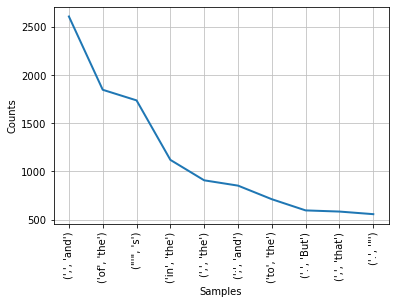

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [9]:
fdist.plot(10)

## Filtrado de bi-gramas

- sin embargo, observamos que los bi-gramas más comunes no representan realmente frases o estructuras léxicas de interes.
- Tal vez, aplicar algun tipo de filtro os permita ver estructuras más relevantes

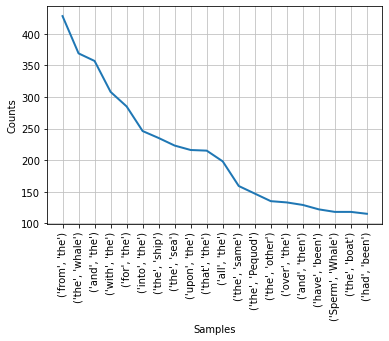

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [11]:
threshold = 2
filtered_bigrams = [bigram for bigram in md_bigrams if len(bigram[0]) > threshold and len(bigram[1]) > threshold]
filtered_dist = FreqDist(filtered_bigrams)
filtered_dist.plot(20)

## Tri-gramas

In [5]:
from nltk.util import ngrams
md_trigrams = list(ngrams(text1, 3))
fdist = FreqDist(md_trigrams)
fdist.most_common(10)

[((',', 'and', 'the'), 187),
 (('don', "'", 't'), 103),
 (('of', 'the', 'whale'), 101),
 ((',', 'in', 'the'), 93),
 ((',', 'then', ','), 87),
 (('whale', "'", 's'), 81),
 (('.', 'It', 'was'), 81),
 (('ship', "'", 's'), 80),
 (('the', 'Sperm', 'Whale'), 77),
 ((',', 'as', 'if'), 76)]

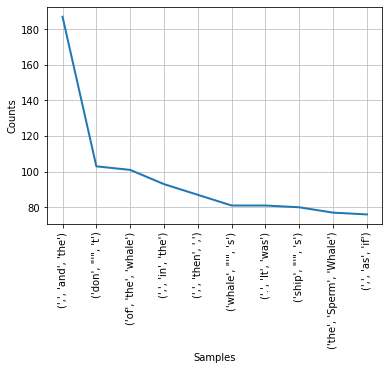

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [13]:
fdist.plot(10)

## Collocations (Colocaciones)

- Son secuencias de palabras que suelen ocurrir en textos o conversaciones con una **frecuencia inusalmente alta**
- Las colocaciones de una palabra son declaraciones formales de donde suele ubicarse tipicamente esa palabra

In [24]:
md_bigrams = list(bigrams(text1))

threshold = 2
filtered_bigrams = [bigram for bigram in md_bigrams if len(bigram[0]) > threshold and len(bigram[1]) > threshold]
filtered_bigrams_dist = FreqDist(filtered_bigrams)

filtered_words = [word for word in text1 if len(word) > threshold]
filtered_word_dist = FreqDist(filtered_words)

df = pd.DataFrame()
df['bi_grams'] = list(set(filtered_bigrams))
df['word_0'] = df['bi_grams'].apply(lambda x: x[0])
df['word_1'] = df['bi_grams'].apply(lambda x: x[1])
df['bi_grams_freq'] = df['bi_grams'].apply(lambda x: filtered_bigrams_dist[x])
df['word_0_freq'] = df['word_0'].apply(lambda x: filtered_word_dist[x])
df['word_1_freq']= df['word_1'].apply(lambda x: filtered_word_dist[x])

In [25]:
df.head(10)

,bi_grams,word_0,word_1,bi_grams_freq,word_0_freq,word_1_freq
0,"(and, such)",and,such,12,6024,336
1,"(happily, gain)",happily,gain,1,4,13
2,"(Their, Historians)",Their,Historians,1,6,1
3,"(his, cursed)",his,cursed,2,2459,11
4,"(that, unseen)",that,unseen,1,2982,14
5,"(suspended, breath)",suspended,breath,1,27,18
6,"(whales, before)",whales,before,1,237,293
7,"(very, great)",very,great,2,311,293
8,"(into, its)",into,its,6,520,372
9,"(heaven, yet)",heaven,yet,1,40,300


## Pointwise Mutual Information (PMI)

Una métrica basada en teoría de la información para encontrar **Collocations.**

$$
PMI=\log{\frac{P(w_1,w_2)}{P(w_1)P(w_2)}}
$$

In [32]:
df['PMI'] = df[['bi_grams_freq', 'word_0_freq', 'word_1_freq']].apply(lambda x: np.log2(x.values[0]/(x.values[1]*x.values[2])), axis = 1)
df['log(bi_grams_freq)'] = df['bi_grams_freq'].apply(lambda x: np.log2(x))
df.head(10)

,bi_grams,word_0,word_1,bi_grams_freq,word_0_freq,word_1_freq,PMI,log(bi_grams_freq)
0,"(and, such)",and,such,12,6024,336,-17.363861,3.584963
1,"(happily, gain)",happily,gain,1,4,13,-5.700440,0.000000
2,"(Their, Historians)",Their,Historians,1,6,1,-2.584963,0.000000
3,"(his, cursed)",his,cursed,2,2459,11,-13.723288,1.000000
4,"(that, unseen)",that,unseen,1,2982,14,-15.349419,0.000000
5,"(suspended, breath)",suspended,breath,1,27,18,-8.924813,0.000000
6,"(whales, before)",whales,before,1,237,293,-16.083500,0.000000
7,"(very, great)",very,great,2,311,293,-15.475528,1.000000
8,"(into, its)",into,its,6,520,372,-14.976564,2.584963
9,"(heaven, yet)",heaven,yet,1,40,300,-13.550747,0.000000


In [30]:
df.sort_values(by = 'PMI', ascending = False)

,bi_grams,word_0,word_1,bi_grams_freq,word_0_freq,word_1_freq,PMI
42884,"(Albert, Durer)",Albert,Durer,1,1,1,0.000000
51406,"(TWISTED, OAKUM)",TWISTED,OAKUM,1,1,1,0.000000
67228,"(Rinaldo, Rinaldini)",Rinaldo,Rinaldini,1,1,1,0.000000
39628,"(unnamable, imminglings)",unnamable,imminglings,1,1,1,0.000000
14127,"(bewildering, mediums)",bewildering,mediums,1,1,1,0.000000
...,...,...,...,...,...,...,...
1873,"(man, the)",man,the,1,508,13721,-22.732783
39401,"(some, the)",some,the,1,578,13721,-22.919024
12235,"(one, the)",one,the,1,889,13721,-23.540138
34822,"(the, not)",the,not,1,13721,1103,-23.851315


## Colocaciones en Gráficos de Dispersión

In [33]:
fig = px.scatter(x = df['PMI'].values, 
                 y = df['log(bi_grams_freq)'], 
                 color = df['PMI'] + df['log(bi_grams_freq)'],
                 hover_name = df['bi_grams'].values, 
                 width = 600, 
                 height = 600,
                 labels = {'x': 'PMI', 'y': 'Log(Bigram Frequency)'})
fig.show()

## Medidas pre-construidas en NLTK
[Documentación](https://www.nltk.org/_modules/nltk/metrics/association.html)

In [6]:
from nltk.collocations import *
bigrams_measures = nltk.collocations.BigramAssocMeasures()
finder = BigramCollocationFinder.from_words(text1)

In [36]:
finder.apply_freq_filter(20)
finder.nbest(bigrams_measures.pmi, 10)

[('Moby', 'Dick'),
 ('Sperm', 'Whale'),
 ('White', 'Whale'),
 ('Right', 'Whale'),
 ('Captain', 'Peleg'),
 (',"', 'said'),
 ('never', 'mind'),
 ('!"', 'cried'),
 ('no', 'means'),
 ('each', 'other')]

## Textos en Español

In [38]:
nltk.download('cess_esp')
corpus = nltk.corpus.cess_esp.sents()
flatten_corpus = [w for l in corpus for w in l]

[nltk_data] Downloading package cess_esp to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package cess_esp is already up-to-date!


In [40]:
print(flatten_corpus[:50])

['El', 'grupo', 'estatal', 'Electricité_de_France', '-Fpa-', 'EDF', '-Fpt-', 'anunció', 'hoy', ',', 'jueves', ',', 'la', 'compra', 'del', '51_por_ciento', 'de', 'la', 'empresa', 'mexicana', 'Electricidad_Águila_de_Altamira', '-Fpa-', 'EAA', '-Fpt-', ',', 'creada', 'por', 'el', 'japonés', 'Mitsubishi_Corporation', 'para', 'poner_en_marcha', 'una', 'central', 'de', 'gas', 'de', '495', 'megavatios', '.', 'Una', 'portavoz', 'de', 'EDF', 'explicó', 'a', 'EFE', 'que', 'el', 'proyecto']


In [42]:
finder = BigramCollocationFinder.from_documents(corpus)
finder.apply_freq_filter(10)
finder.nbest(bigrams_measures.pmi, 10)

[('señora', 'Aguirre'),
 ('secretario', 'general'),
 ('elecciones', 'generales'),
 ('campaña', 'electoral'),
 ('quiere', 'decir'),
 ('Se', 'trata'),
 ('segunda', 'vuelta'),
 ('director', 'general'),
 ('primer', 'ministro'),
 ('primer', 'lugar')]

In [43]:
ll = ['vamos', 'a', 'ver', 'a', 'que', 'tipo', 'de', 'moneda', 'vamos', 'a', 'convertir']

In [44]:
fdist = FreqDist(ll)

In [51]:
fdist.most_common(2)

[('a', 3), ('vamos', 2)]

In [1]:
vocabulario = ['off', 'spring','and', 'seized', 'anything', 'critical', 'the', 'in', 'thus']

In [2]:
fdist = [('off', 244), ('spring', 23), ('and', 300), ('seized', 16), ('anything', 24), ('critical', 67), ('the', 240), ('in', 23), ('thus', 12)]

In [7]:
md_bigrams = list(bigrams(text1))

In [8]:
fdist = FreqDist(md_bigrams)